In [1]:
import numpy as np
import xarray as xr
import uxarray as ux
import pandas as pd

from scipy.spatial import Delaunay

import spatialpandas as sp
import spatialpandas.dask 
from spatialpandas.io import to_parquet, read_parquet

import holoviews as hv
from holoviews import opts
from holoviews.operation.datashader import rasterize
import datashader as ds
import datashader.transfer_functions as tf
import geoviews as gv
import geoviews.feature as gf

import hvplot.pandas  
import hvplot.xarray  
import hvplot.dask

from matplotlib import cm
import cartopy.crs as ccrs



In [2]:
import sys
%load_ext autoreload
%autoreload 2

sys.path.insert(1, '/glade/u/home/philipc/geocat-scratch/polymesh/polymesh')

from polymesh import polymesh as polymesh

# Small (~4,000 faces)

In [49]:
def polymesh_mesh_workflow_small():
    projection = ccrs.Robinson()
    geoflow = polymesh(ds=ds_grid, projection=projection)
    df = geoflow.data_mesh(name="v2", dims={"time" : 0, "meshLayers" : 0}, fill='nodes')
    
def delaunay_mesh_workflow_small(furthest_site=False):
    x = ds_grid.ds['mesh_node_x']
    y = ds_grid.ds['mesh_node_y']
    points = np.vstack([x, y]).T
    triang = Delaunay(points, furthest_site)
    pd.DataFrame(triang.simplices, columns=['v0', 'v1', 'v2'])

In [46]:
# GeoFlow Small (6,000 nodes) or Large (6mil nodes)
ds_base_path = "/glade/p/cisl/vast/vapor/data/Source/UGRID/NOAA-geoflow/small/"

# UXarray
ds_grid = ux.open_dataset(ds_base_path + "grid.nc",
                          ds_base_path + "v1.000000.nc",
                          ds_base_path + "v2.000000.nc",
                          ds_base_path + "v3.000000.nc")


Loading initial grid from file:  /glade/p/cisl/vast/vapor/data/Source/UGRID/NOAA-geoflow/small/grid.nc


### Mesh Construction

In [6]:
%timeit -r 10 -n 10 polymesh_mesh_workflow_small()

17.6 ms ± 2.53 ms per loop (mean ± std. dev. of 10 runs, 10 loops each)


In [50]:
%timeit -r 10 -n 10 delaunay_mesh_workflow_small(False)

21.4 ms ± 823 µs per loop (mean ± std. dev. of 10 runs, 10 loops each)


In [15]:
%timeit -r 10 -n 10 delaunay_mesh_workflow_small(True)

20.5 ms ± 1.03 ms per loop (mean ± std. dev. of 10 runs, 10 loops each)


# Large (~4,000,000 faces)

In [51]:
def polymesh_mesh_workflow_large():
    projection = ccrs.Robinson()
    geoflow = polymesh(ds=ds_grid, projection=projection)
    df = geoflow.data_mesh(name="v2", dims={"time" : 0, "meshLayers" : 0}, fill='nodes')
    
def delaunay_mesh_workflow_large(furthest_site=False):
    x = ds_grid.ds['mesh_node_x']
    y = ds_grid.ds['mesh_node_y']
    points = np.vstack([x, y]).T
    triang = Delaunay(points, furthest_site)
    pd.DataFrame(triang.simplices, columns=['v0', 'v1', 'v2'])

In [4]:
# GeoFlow Small (6,000 nodes) or Large (6mil nodes)
ds_base_path = "/glade/p/cisl/vast/vapor/data/Source/UGRID/NOAA-geoflow/large/"

# UXarray
ds_grid = ux.open_dataset(ds_base_path + "grid.nc",
                          ds_base_path + "v1.000000.nc",
                          ds_base_path + "v2.000000.nc",
                          ds_base_path + "v3.000000.nc")

Loading initial grid from file:  /glade/p/cisl/vast/vapor/data/Source/UGRID/NOAA-geoflow/large/grid.nc


### Polymesh

In [21]:
%timeit -r 2 -n 2 polymesh_mesh_workflow_large()

12.1 s ± 197 ms per loop (mean ± std. dev. of 2 runs, 2 loops each)


### SciPy (Furthest Site False)

In [22]:
%timeit -r 2 -n 2 delaunay_mesh_workflow_large(False)

45.9 s ± 1.87 s per loop (mean ± std. dev. of 2 runs, 2 loops each)


### SciPy (Furthest Site True)

In [54]:
%timeit -r 2 -n 2 delaunay_mesh_workflow_large(True)

40.9 s ± 856 ms per loop (mean ± std. dev. of 2 runs, 2 loops each)


# Very Large (~25,000,000 faces)

In [37]:
def polymesh_mesh_workflow_very_large():
    projection = ccrs.PlateCarree()
    geoflow = polymesh(ds=ds_grid, projection=projection)
    df = geoflow.data_mesh(name="TMQ", dims={"time" : 0}, fill='faces')
    
def delaunay_mesh_workflow_very_large(furthest_site=False):
    x = ds_grid.ds['Mesh2_node_x']
    y = ds_grid.ds['Mesh2_node_y']
    points = np.vstack([x, y]).T
    tri = Delaunay(points, furthest_site, incremental=True)

In [30]:
ds_base_path = "/glade/scratch/ullrich/SCREAMv0/"

ds_grid = ux.open_dataset(ds_base_path + "meshCSne1024pg2.g",
                          ds_base_path + "SCREAMv0.SCREAM-DY2.ne1024pg2.20201127.eam.h0.2020-01-20-00000.TMQ.nc")


Loading initial grid from file:  /glade/scratch/ullrich/SCREAMv0/meshCSne1024pg2.g
Reading exodus file:  /glade/scratch/ullrich/SCREAMv0/meshCSne1024pg2.g
Finished reading exodus file.


In [34]:
%timeit -r 2 -n 1 polymesh_mesh_workflow_very_large()

1min 6s ± 5.18 s per loop (mean ± std. dev. of 2 runs, 1 loop each)


In [35]:
%timeit -r 2 -n 1 delaunay_mesh_workflow_very_large(False)

3min 4s ± 2.13 s per loop (mean ± std. dev. of 2 runs, 1 loop each)


In [38]:
%timeit -r 2 -n 1 delaunay_mesh_workflow_very_large(False)

3min 21s ± 1.13 s per loop (mean ± std. dev. of 2 runs, 1 loop each)


In [36]:
%timeit -r 2 -n 1 delaunay_mesh_workflow_very_large(True)

3min 12s ± 694 ms per loop (mean ± std. dev. of 2 runs, 1 loop each)


AttributeError: module 'psyplot.project' has no attribute 'mapplot'

# Other

In [66]:
ds_grid.ds

<xarray.Dataset>
Dimensions:          (nMeshFaces: 3932160, nFaceNodes: 4, nMeshNodes: 6144000, meshLayers: 20, time: 1)
Coordinates:
    mesh_node_x      (nMeshNodes) float64 0.0 4.991 16.04 ... 36.65 36.79 36.86
    mesh_node_y      (nMeshNodes) float64 89.19 89.24 89.3 ... -26.79 -26.81
  * time             (time) float64 11.0
Dimensions without coordinates: nMeshFaces, nFaceNodes, nMeshNodes, meshLayers
Data variables:
    mesh             int32 ...
    mesh_face_nodes  (nMeshFaces, nFaceNodes) uint32 ...
    mesh_depth       (meshLayers, nMeshNodes) float64 ...
    v1               (time, meshLayers, nMeshNodes) float64 dask.array<chunksize=(1, 20, 6144000), meta=np.ndarray>
    v2               (time, meshLayers, nMeshNodes) float64 dask.array<chunksize=(1, 20, 6144000), meta=np.ndarray>
    v3               (time, meshLayers, nMeshNodes) float64 dask.array<chunksize=(1, 20, 6144000), meta=np.ndarray>

In [6]:
%%time
x = ds_grid.ds['mesh_node_x'].values
y = ds_grid.ds['mesh_node_y'].values
z = ds_grid.ds['v1'][0][0].values

points = np.vstack([x, y]).T
# verts = pd.DataFrame(np.stack((x,y,z)).T, columns=['x', 'y', 'z'])

triang = Delaunay(points)
# tris = pd.DataFrame(triang.simplices, columns=['v0', 'v1', 'v2'])

CPU times: user 41.8 s, sys: 1.62 s, total: 43.4 s
Wall time: 45.1 s


In [65]:
import datashader.utils as du

du.mesh(verts,tris)

AssertionError: If no vertex weight column is provided, a triangle weight column is required.

In [26]:
import datashader.utils as du

def createHVTriMesh(x,y,triangle_indices, var,n_workers=1):
    # Declare verts array
    verts = np.column_stack([x, y, var])

    # Convert to pandas
    verts_df  = pd.DataFrame(verts,  columns=['x', 'y', 'z'])
    tris_df   = pd.DataFrame(triangle_indices, columns=['v0', 'v1', 'v2'])

    # Declare HoloViews element
    mesh = du.mesh(verts_df,tris_df)
    return mesh, verts_df, tris_df

In [16]:
from matplotlib.tri import Triangulation

tris = Triangulation(x,y).triangles

In [27]:
%%time

mesh,verts,tris = createHVTriMesh(x, y, tris, z)

CPU times: user 395 ms, sys: 238 ms, total: 634 ms
Wall time: 937 ms


CPU times: user 656 ms, sys: 0 ns, total: 656 ms
Wall time: 699 ms


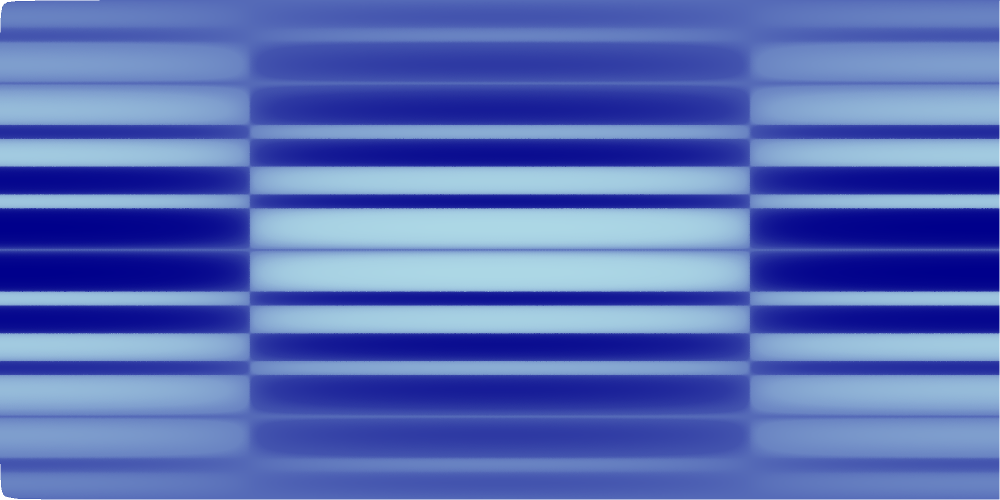

In [30]:
cvs = ds.Canvas(plot_height=1000, plot_width=2000)
%time agg = cvs.trimesh(verts, tris, mesh=mesh)
tf.shade(agg)
